In [35]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import math
import warnings
warnings.filterwarnings("ignore")
import random
from IPython.display import Image

#from IPython.core.interactiveshell import InteractiveShell
#InteractiveShell.ast_node_interactivity = "all"

## Problem 1

In [2]:
#Given dissimilarity matrix:
dis = np.array([[0, 0.3, 0.4, 0.7],[0.3, 0, 0.5, 0.8], [0.4, 0.5, 0, 0.45], [0.7, 0.8, 0.45, 0]])
# Label observations a, b, c, d so that dis[a, b] = 0.3, dis[a, c] = 0.4, dis[a, d] = 0.7, etc

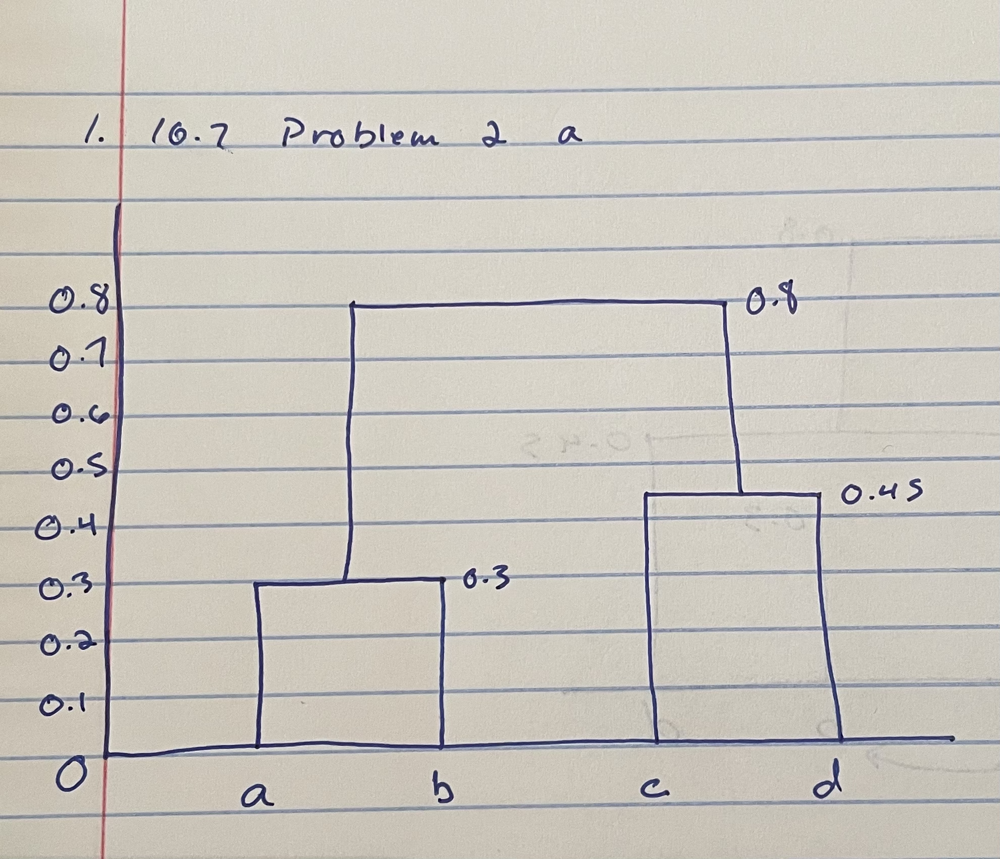

In [3]:
# Part a
Image("Homework6Problem1a.png")

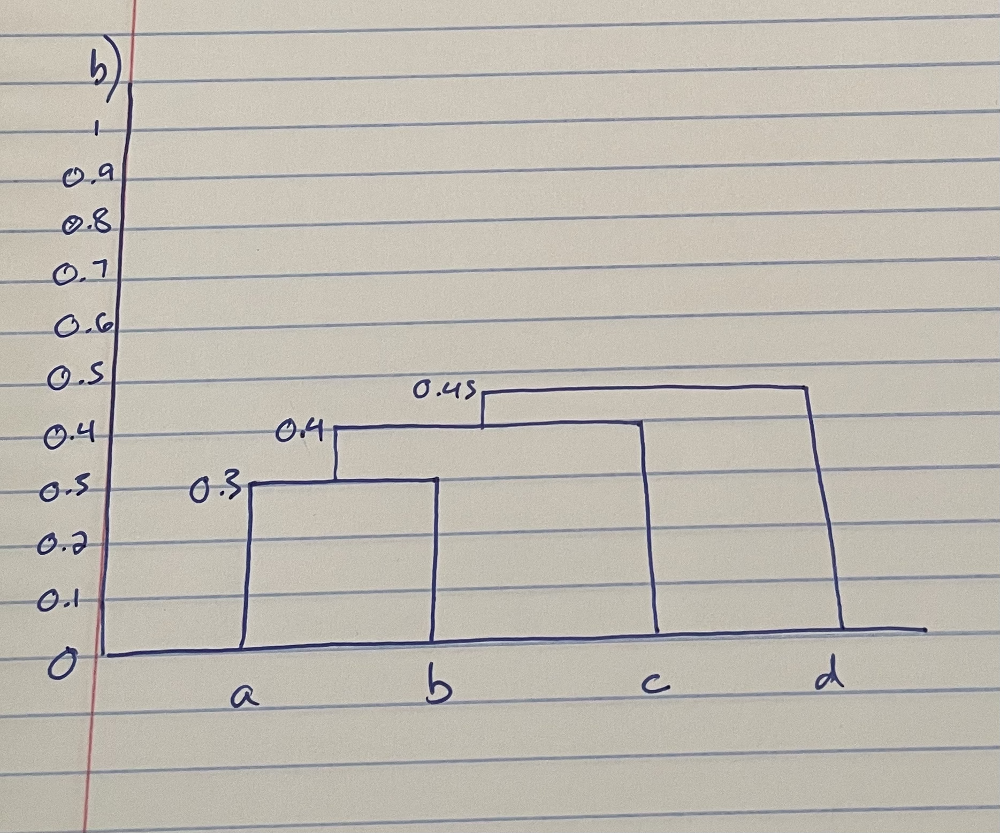

In [4]:
# Part b
Image("Homework6Problem1b.png")

Part c

Cluster 1: a, b

Cluster 2: c, d

Part d

Cluster 1: a, b, c

Cluster 2: d

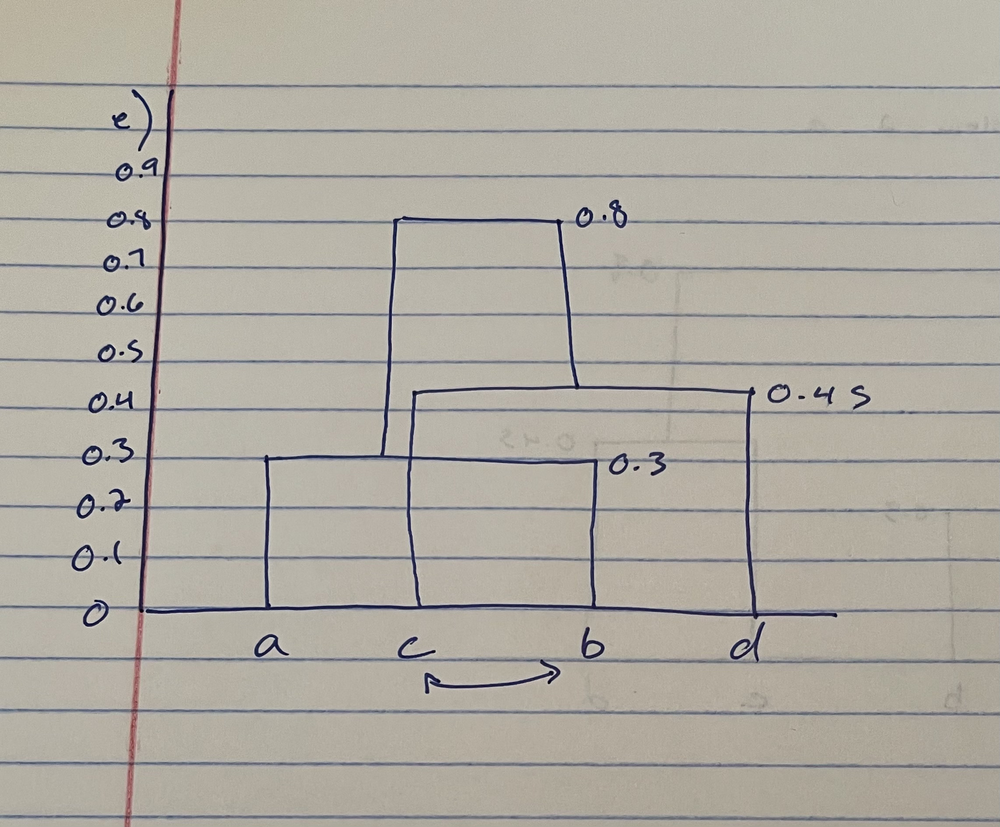

In [5]:
# Part e
Image("Homework6Problem1e.png")

## Problem 2

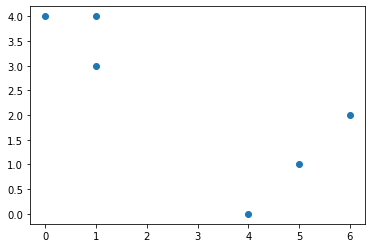

In [6]:
# Part a
x1 = pd.Series(data = (1, 1, 0, 5, 6, 4))
x2 = pd.Series(data = (4, 3, 4, 1, 2, 0))
plt.scatter(x1, x2)

Part b

In [7]:
random.sample([1,2,3,4,5,6], 3)

[5, 1, 6]

In [8]:
# Random sample set the 1st, 5th and 6th entries as one part of one centroid initially
centroid = pd.Series(data = (2, 1, 1, 1, 2, 2))
df = pd.DataFrame(data = {"x1": x1, "x2": x2, "centroid": centroid})
df

,x1,x2,centroid
0,1,4,2
1,1,3,1
2,0,4,1
3,5,1,1
4,6,2,2
5,4,0,2


Part c

In [33]:
# Define functions to recompute centroid means and euclidean distance

def compute_centroid_means():
    centroid_means = df.groupby(["centroid"]).mean()

    centroid_one_x1 = centroid_means.loc[[1]]["x1"]
    centroid_one_x2 = centroid_means.loc[[1]]["x2"]
    centroid_two_x1 = centroid_means.loc[[2]]["x1"]
    centroid_two_x2 = centroid_means.loc[[2]]["x2"]
    
    return (centroid_one_x1, centroid_one_x2, centroid_two_x1, centroid_two_x2)

def compute_dist(x0, xf, y0, yf):
    return math.sqrt((x0-xf)**2 + (y0-yf)**2)

In [10]:
centroids = compute_centroid_means()
centroids

(centroid
 1    2.0
 Name: x1, dtype: float64,
 centroid
 1    2.666667
 Name: x2, dtype: float64,
 centroid
 2    3.666667
 Name: x1, dtype: float64,
 centroid
 2    2.0
 Name: x2, dtype: float64)

Part d and e

In [34]:
# Recompute centroids

for index, row in df.iterrows():
    x1 = row["x1"]
    x2 = row["x2"]
    
    dist_to_one = compute_dist(x1, centroids[0], x2, centroids[1])
    dist_to_two = compute_dist(x1, centroids[2], x2, centroids[3])
    
    if dist_to_one <= dist_to_two:
        row["centroid"] = 1
    else:
        row["centroid"] = 2
        
df  

,x1,x2,centroid
0,1,4,1
1,1,3,1
2,0,4,1
3,5,1,2
4,6,2,2
5,4,0,2


Part f

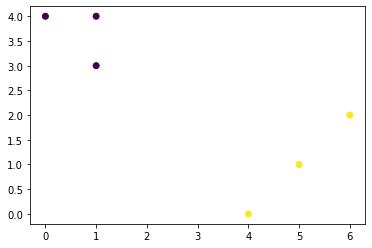

In [12]:
plt.scatter(df.x1, df.x2, c=df.centroid)

## Problem 3 ##

a) The fusion will occur higher on the tree in complete linkage because complete linkage sets the dissimilarity of the two groups to be the maximum pairwise dissimilarity, while single linkage sets the dissimilarity of the two groups to be the minimum pairwise dissimilarity.

b) The fusion will occur at the same height for both single and complete linkage because the minimal and maximal pairwise dissimilarities are the same when clusters are each made up of single observations

## Problem 4

For the graph on the left, the clusters would be primarily determined based on the number of socks each shopper purchased, because every shopper has purchased at least 5 pairs of socks and at most 1 computer, and the purchases are measured on the same absolute scale. This means that whether a customer purchased a computer will not have as much of an effect on the clusters as it probably should, given the relative values of computers and socks. With K=2, the clusters would be based on the number of total items purchased. Most of the shoppers will be in one cluster, with potentially just orange or orange and pink in the other cluster.

For the graph in the center, whether a shopper purchased a computer will also be determinative of the cluster that shopper ends up in. Because each variable is scaled by its standard deviation, and each shopper purchased one or zero computers, it is likely that with K=2 whether a shopper purchased a computer will actually be the determinative factor in clustering. This is because the Euclidean distance of the scaled computer purchases, between purchasing 0 computers versus purchasing 1 computer, is greater than any distance in sock purchases. Two observations will be close if they purchased the same amount of computers, and farther if they purchased different amounts of computers. Yellow, blue, red, and pink will be in one cluster, and the rest will be in another.

For the graph at right, computer purchase history will completely drive the dissimilarities because of how much more valuable a computer is than a few pairs of socks. Whether a shopper purchased a computer will determine if they are in a specific cluster, so yellow, blue, red, and pink will be in one cluster, while the rest will be in another cluster for K=2.

## Problem 5

In [13]:
from sklearn.preprocessing import scale
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram
from scipy.cluster.hierarchy import linkage

usa = pd.read_csv("USArrests.csv")
usa.rename(columns={"Unnamed: 0": "State"}, inplace=True)
X = usa[["Murder", "Assault", "UrbanPop", "Rape"]]

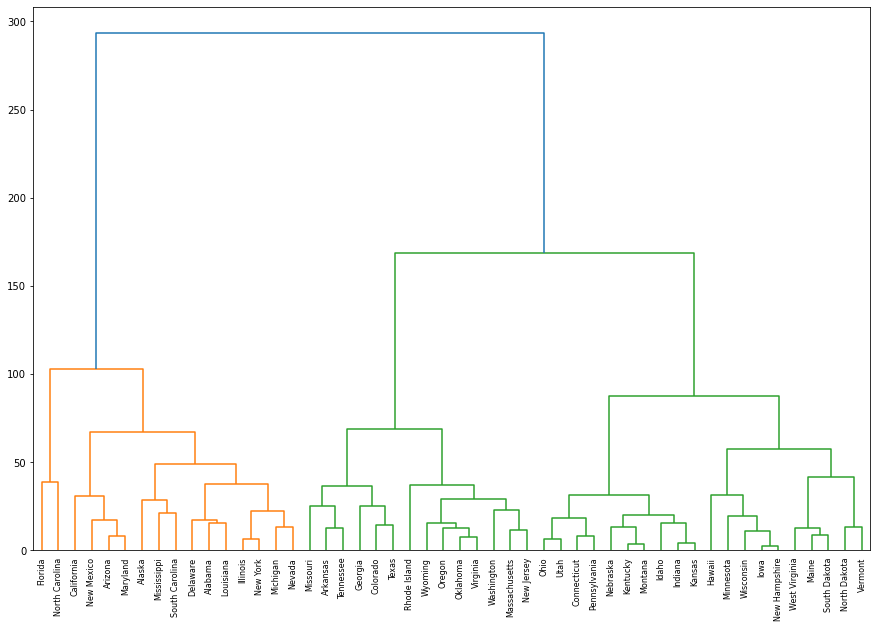

In [14]:
arrest_clusters = AgglomerativeClustering(linkage = "complete", affinity = "euclidean").fit(X)
linkage_matrix = linkage(X, "complete")
plt.figure(figsize=(15, 10))
dendro = dendrogram(linkage_matrix, labels=usa["State"].tolist())

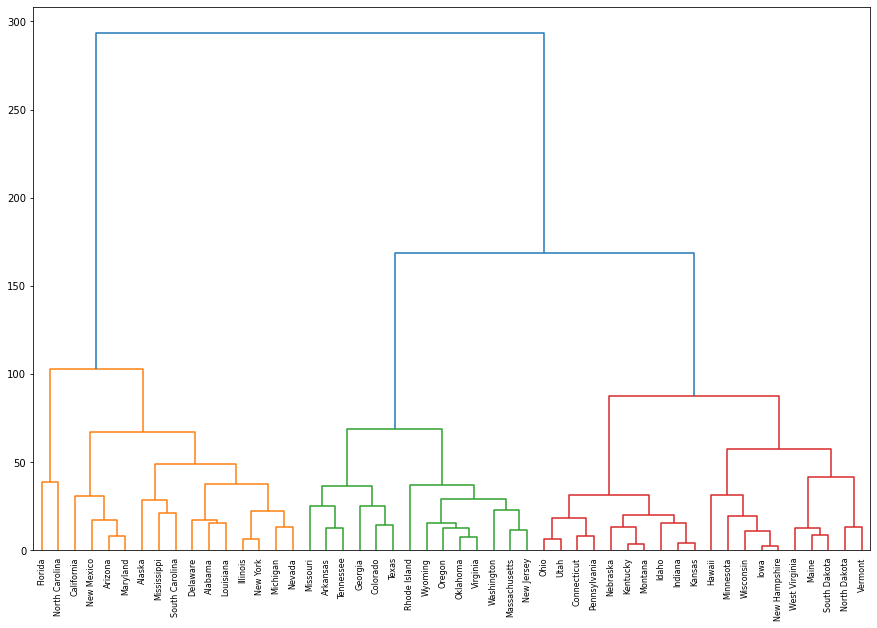

In [15]:
plt.figure(figsize=(15, 10))
dendro = dendrogram(linkage_matrix, labels=usa["State"].tolist(), color_threshold = 150)
# Cluster 1 (Orange): FL, NC, CA, NM, AZ, MD, AK, MS, SC, DE, AL, LA, IL, NY, MI, NV
# Cluster 2 (Green): MO, AR, TN, GA, CO, TX, RI, WY, OR, OK, VA, WA, MA, NJ
# Cluster 3 (Red): everything else

Part c

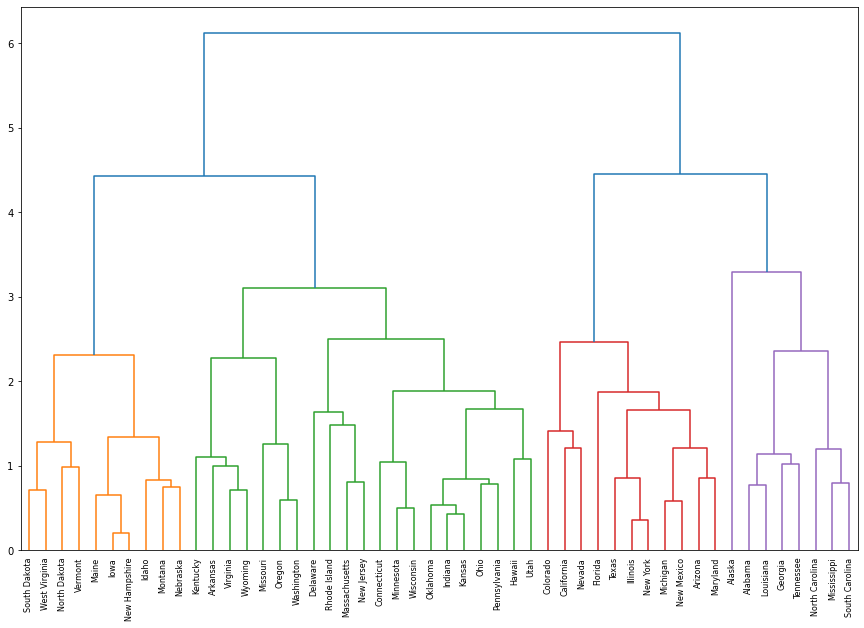

In [16]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

arrest_clusters_scaled = AgglomerativeClustering(linkage = "complete", affinity = "euclidean").fit(X_scaled)
linkage_matrix_scaled = linkage(X_scaled, "complete")
plt.figure(figsize=(15, 10))
dendro_scaled = dendrogram(linkage_matrix_scaled, labels=usa["State"].tolist())

Part d

Scaling the variables creates clusters that better reflect arrests overall in states. This is because the different variables that we cluster the states on are on different unit scales, in particular crime rates and urban population. Scaling the variables fixes this issue, as in the example of computers and socks, allowing us to see true differences in the data. Therefore the varibles should be scaled before computing inter-observation dissimilarities.

## Problem 6

Part a

In [38]:
tissue = pd.read_csv("cH10Ex11.csv", header=None).transpose()

In [39]:
tissue_clusters = AgglomerativeClustering(linkage = "complete", affinity = "correlation").fit(tissue)

Part b

The genes broadly separate into two groups, as the unhealthy tissue labels and healthy tissue labels are fused only close to the top of the dendrogram. It seems clear that the unhealthy tissue samples are more related than the healthy tissue samples, as they fuse at lower levels on the dendrogram than the healthy tissues. This is true for both complete and single linkage. Complete linkage gives a better sense of the data, because there should be a clear distinction between healthy and unhealthy tissues.

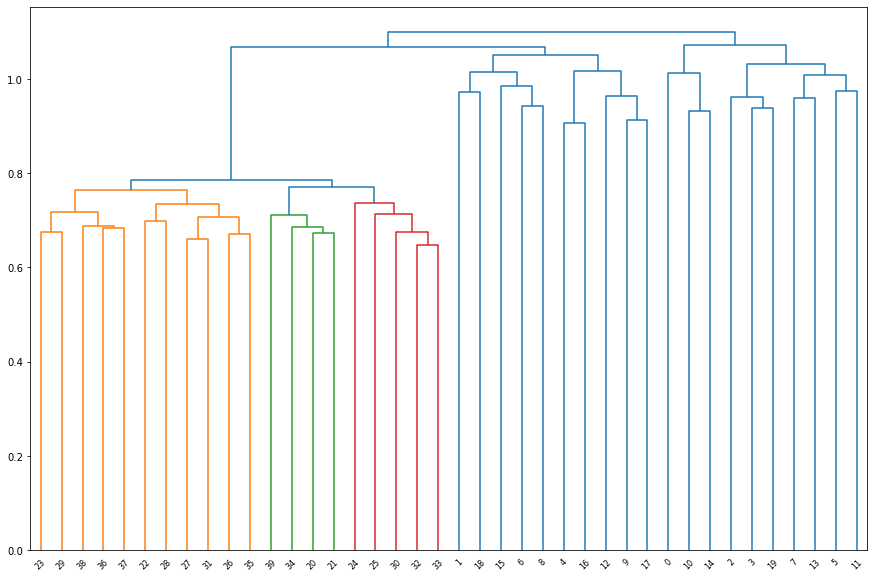

In [40]:
Z = linkage(tissue, "complete", "correlation")
plt.figure(figsize=(15, 10))
dendro = dendrogram(Z)

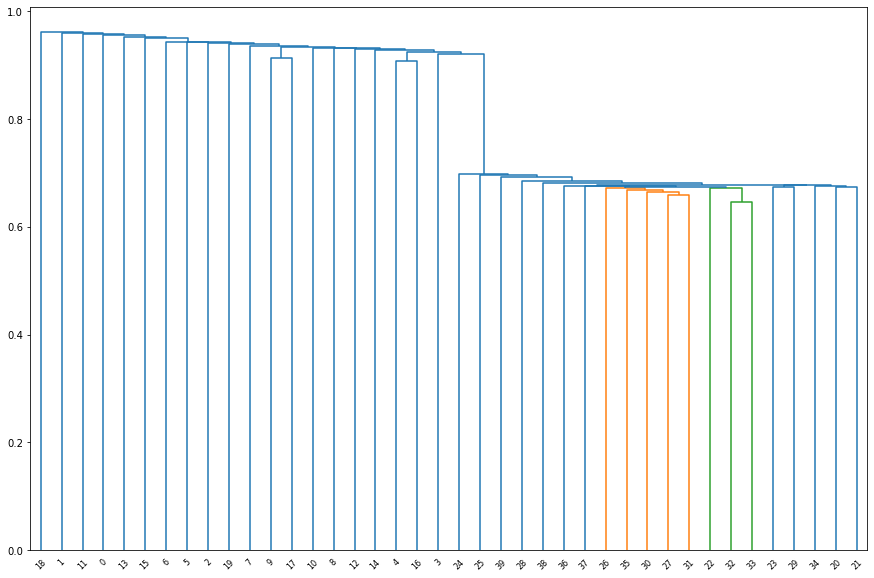

In [41]:
Z = linkage(tissue, "single", "correlation")
plt.figure(figsize=(15, 10))
dendro = dendrogram(Z)

Part c

Take the average value of each gene in the dataset based on whether the tissue is healthy or not, and find the 20 genes with the most different average values across the different samples. Below:

In [22]:
# Get data and set a flag to denote whether the tissue is healthy or not

tissue = pd.read_csv("cH10Ex11.csv", header=None).transpose()
tissue["health"] = ""

def set_health(index):
    if index < 20:
        return "healthy"
    else:
        return "unhealthy"

for index in tissue.iterrows():
    row_num = index[0]
    tissue["health"][row_num] = set_health(row_num)

In [23]:
# Find the average value for each gene based for both healthy and unhealthy tissue

means = tissue.groupby(["health"]).mean()

means_transposed = means.transpose()
means_transposed["gene"] = 0

for index in means_transposed.iterrows():
    row_num = index[0]
    means_transposed["gene"][row_num] = row_num

In [24]:
# Show the 20 genes with largest difference in average values between healthy and unhealthy tissue
means_transposed = means_transposed[["healthy","unhealthy","gene"]]
means_transposed["abs_diff"] = means_transposed["healthy"] - means_transposed["unhealthy"]
means_transposed.sort_values(by='abs_diff', ascending=False).head(20)

health,healthy,unhealthy,gene,abs_diff
134,0.579468,-0.365864,134,0.945332
171,0.232898,-0.591776,171,0.824674
461,0.043662,-0.764417,461,0.808079
468,0.713647,-0.091217,468,0.804864
115,0.213548,-0.545557,115,0.759105
76,0.398839,-0.358199,76,0.757039
767,0.269822,-0.464936,767,0.734757
292,0.253245,-0.477051,292,0.730296
336,0.442838,-0.253097,336,0.695935
262,0.417835,-0.275203,262,0.693038


## Problem 7

In [25]:
from surprise import Dataset, Reader, KNNWithMeans

In [29]:
# Get data from the movielens dataset
# Get titles of the movies for recommendations

movielens = Dataset.load_builtin('ml-100k')

movies = pd.read_csv("surprise_data/ml-100k/ml-100k/u.item",sep="\|", header=None).iloc[:,0:2]

movies.columns = ["movie_id", "movie_title"]

In [27]:
# Set parameters
sim_options = {
    "name": "cosine",
    "user_based": False
}

# Build and fit model
algo = KNNWithMeans(sim_options=sim_options)
trainset = movielens.build_full_trainset()
algo.fit(trainset)

# Build testset and rating predictions for movies that each user has not seen before
testset = trainset.build_anti_testset()
predictions = algo.test(testset)

Computing the cosine similarity matrix...
Done computing similarity matrix.


In [30]:
# Get all predictions for user 192, pulling the id of the movie and the estimated rating into a dictionary
pred_192 = {}

for pred in predictions:
    if pred[0] == "192":
        pred_192[pred[1]] = pred[3]

In [31]:
# A list to contain the ids of the movies
top_recs = []

# Sort by values and get the top 5 movies
for movie_id in sorted(pred_192, key = lambda x: pred_192[x], reverse=True)[:5]:
    top_recs.append(movie_id)
    print("Movie ID: ", movie_id, "Projected rating: ", pred_192[movie_id])

# Show the top 5 recommended movies for user 192
movies[movies["movie_id"].isin(top_recs)]

Movie ID:  1500 Projected rating:  5
Movie ID:  1293 Projected rating:  5
Movie ID:  1653 Projected rating:  5
Movie ID:  1201 Projected rating:  5
Movie ID:  814 Projected rating:  4.948093516865141


,movie_id,movie_title
813,814,"Great Day in Harlem, A (1994)"
1200,1201,Marlene Dietrich: Shadow and Light (1996)
1292,1293,Star Kid (1997)
1499,1500,Santa with Muscles (1996)
1652,1653,Entertaining Angels: The Dorothy Day Story (1996)
